# Análisis Comparativo de Algoritmos de Agrupamiento para la Extracción de Paletas de Colores

## 1. Introducción y Selección de Datos
El objetivo de este proyecto es desarrollar un marco de trabajo de Machine Learning no supervisado capaz de extraer paletas de colores representativas mediante el uso de múltiples estrategias de agrupamiento. Al deconstruir digitalmente la estructura cromática de las obras en el espacio perceptual **CIELAB**, el sistema evalúa la eficacia de diferentes modelos para capturar la esencia estética de una imagen.

### Selección del Dataset: Diversidad Estilística y Desafíos Cromáticos
Para validar la robustez de los modelos, se ha seleccionado un conjunto de datos que trasciende géneros específicos, abarcando paradigmas visuales que presentan desafíos técnicos diferenciados:

1.  **Grandes Masas y Transiciones Suaves (Paisajismo y Abstracción):** Obras con áreas extensas de color plano o degradados (ej. el *Bokashi* en el Ukiyo-e o los campos de color de Rothko). Representa un desafío para la definición de fronteras entre clusters.
2.  **Alta Entropía y Micro-detalles (Escenas de Batalla y Expresionismo):** Imágenes con alta saturación, patrones complejos y contrastes elevados (ej. el *Musha-e* japonés o las composiciones de Arshile Gorky). Este escenario pone a prueba la capacidad de los algoritmos para filtrar el ruido visual sin omitir colores clave.
3.  **Minimalismo y Variaciones Sutiles (Retratos y Monocromía):** Enfoque en diferencias cromáticas mínimas bajo condiciones de bajo contraste (ej. las pinturas "negras" de Ad Reinhardt). Requiere una alta sensibilidad para detectar variaciones apenas perceptibles al ojo humano (bajo $\Delta E$).

### Motivación Técnica: Un Enfoque Multi-Algoritmo
La herramienta actúa como un motor de ingeniería inversa cromática, comparando tres familias de algoritmos para determinar cuál se adapta mejor a la naturaleza de cada obra:

* **K-Means (Agrupamiento por Partición):** Utilizado como línea base para identificar centros de masa cromática definidos, asumiendo clusters convexos.
* **HDBSCAN (Agrupamiento Jerárquico basado en Densidad):** Empleado para descubrir estructuras de color de forma y tamaño arbitrario, permitiendo la identificación de "ruido" o artefactos visuales. 
* **Mean Shift (Agrupamiento por Desplazamiento de Media):** Utilizado para localizar los modos de mayor densidad en el espacio de color sin necesidad de predefinir el número de clusters ($K$).

Este enfoque permite optimizar hiparámetros críticos, garantizando una síntesis artística que respete la intención cromática original de la obra.

In [51]:
import math
from abc import ABC, abstractmethod
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
from hdbscan import HDBSCAN
from matplotlib.axes import Axes
from PIL import Image
from skimage import color
from sklearn.base import BaseEstimator
from sklearn.cluster import KMeans, MeanShift, estimate_bandwidth
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score
from sklearn.utils import resample

In [52]:
class ImageLoader:
    def __init__(self, images_folder_dir: str = "images"):
        self.images_folder_path = Path.cwd() / images_folder_dir
        self.valid_ext = {".jpg", ".jpeg", ".png"}
        self.image_files = []
        self._load_images()

    def _is_valid_image(self, file_path: Path) -> bool:
        return file_path.is_file() and file_path.suffix.lower() in self.valid_ext

    def _load_images(self):
        self.image_files = [
            f for f in self.images_folder_path.glob("*") if self._is_valid_image(f)
        ]

    def load_image(self, file_path: Path) -> Path:
        image_path = self.images_folder_path / file_path
        if image_path.exists():
            return image_path
        raise FileNotFoundError()

    def plot_images(self, limit: int = 10, cols: int = 5):
        images_to_show = self.image_files[:limit]

        if not images_to_show:
            return

        rows = math.ceil(len(images_to_show) / cols)

        plt.figure(figsize=(15, 3.5 * rows))
        plt.suptitle("Paintings Gallery", fontsize=16, fontweight="bold")

        for i, filepath in enumerate(images_to_show):
            img = Image.open(filepath)
            plt.subplot(rows, cols, i + 1)
            plt.title(f"{i + 1}: {filepath.stem}", fontsize=12)
            plt.imshow(img)
            plt.axis("off")

        plt.tight_layout()
        plt.show()

## 2. Preprocesamiento de Imágenes (Pipeline)

Para que los modelos de agrupamiento puedan procesar la información visual de manera efectiva, se transforma la imagen de su formato matricial original a una estructura de datos tabular optimizada para el análisis perceptual.

**Decisiones de Diseño del Pipeline:**

1.  **Conversión al Espacio de Color CIELAB:** A diferencia del espacio RGB, se ha implementado la transformación a **CIELAB**. Este espacio es **perceptualmente uniforme**, lo que significa que la distancia euclidiana entre dos puntos en el espacio $L*a*b*$ corresponde proporcionalmente a la diferencia de color percibida por el ojo humano ($\Delta E$). Esto permite que algoritmos como **HDBSCAN** y **Mean Shift** agrupen colores basándose en similitud visual real y no solo en valores numéricos de brillo digital.

2.  **Reducción de Resolución y Muestreo:** Se aplica un factor de reescalado (por defecto **25%**) utilizando interpolación de **LANCZOS** para reducir el ruido de alta frecuencia y mejorar la eficiencia computacional. Este paso actúa como un filtro inicial que facilita la identificación de masas de color dominantes, especialmente en obras con texturas complejas o grano fotográfico.

3.  **Aplanado (Flattening) y Estructura Tabular:** Se transforma la matriz 3D `(H, W, 3)` en una matriz 2D `(N_pixels, 3)`. Este proceso elimina la información posicional de los píxeles, permitiendo que los modelos se centren exclusivamente en la distribución de densidades cromáticas en el espacio de color, ignorando la ubicación de los objetos en la composición artística.

4.  **Normalización y Estabilidad Numérica:** Antes de la conversión a LAB, los valores se normalizan al rango `[0.0, 1.0]`. Esta estandarización es crítica para evitar sesgos durante el cálculo de distancias y asegurar la estabilidad numérica de los modelos de desplazamiento de media y partición.

In [53]:
class FeatureExtractor:
    def extract(self, image_path: Path, resize_factor: float = 0.25) -> np.ndarray:
        raw_image = self._load_image(image_path, resize_factor)
        flattened_pixels = self._flatten(raw_image)
        normalized_pixels = self._normalize(flattened_pixels)
        lab_pixels = color.rgb2lab(normalized_pixels.reshape(-1, 1, 3)).reshape(-1, 3)
        return lab_pixels

    def _load_image(self, path: Path, resize_factor: float) -> np.ndarray:
        with Image.open(path) as img:
            new_size = (int(img.width * resize_factor), int(img.height * resize_factor))
            img = img.resize(new_size, Image.Resampling.LANCZOS)
            return np.array(img.convert("RGB"))

    def _flatten(self, image: np.ndarray) -> np.ndarray:
        return image.reshape(-1, 3)

    def _normalize(self, pixels: np.ndarray) -> np.ndarray:
        if pixels.dtype == np.uint8:
            return pixels.astype(np.float32) / 255.0
        return pixels.astype(np.float32)

## 3. Metodología de Agrupamiento y Evaluación

Para garantizar la extracción de paletas que sean tanto técnicamente cohesivas como artísticamente diversas, el sistema utiliza una arquitectura orientada a objetos que permite la comparación equitativa entre distintos algoritmos.

### 3.1. Arquitectura del Agrupador (`BaseColorGrouper`)
Se implementó una interfaz abstracta que define el ciclo de vida de cada experimento. Esta estructura asegura que cada modelo (K-Means, HDBSCAN, Mean Shift) cumpla con un contrato común de entrenamiento, evaluación y búsqueda de hiperparámetros.

* **Muestreo Estadístico:** Para optimizar la velocidad de procesamiento sin perder la representatividad cromática, se utiliza un muestreo aleatorio mediante `_get_sample` (por defecto 5,000 puntos), asegurando la reproducibilidad mediante un estado aleatorio fijo (42).
* **Búsqueda de Hiperparámetros:** Cada implementación concreta utiliza el método `find_best_grouping` para iterar sobre sus parámetros críticos (como $K$ en K-Means o Epsilon en HDBSCAN), almacenando un historial de rendimiento para su posterior análisis visual.

### 3.2. Métrica de Calidad: `PaletteEvaluator`
La selección de la "mejor" paleta no depende de un criterio subjetivo, sino de una métrica compuesta que equilibra dos fuerzas opuestas:

1.  **Cohesión Cromática (Silhouette Score):** Utiliza el coeficiente de silueta para medir qué tan similares son los píxeles dentro de un mismo grupo en comparación con los píxeles de otros grupos. En el espacio **CIELAB**, un score alto indica que los colores de la paleta están claramente diferenciados y son compactos.
2.  **Bono de Diversidad:** Para evitar que el modelo elija paletas excesivamente simplistas (de solo 2 colores), se implementó un factor de diversidad basado en el logaritmo del número de clusters ($k$) normalizado por un límite superior ($k_{limit}$).

**Ecuación de Evaluación:**
El puntaje final se calcula mediante una suma ponderada:

$$Score = (w_{cohesion} \cdot S) + (w_{diversity} \cdot \frac{\log_{10}(k)}{\log_{10}(k_{limit})})$$

Donde el peso de cohesión ($w_{cohesion} = 0.7$) prioriza la limpieza del color, mientras que el peso de diversidad ($0.3$) incentiva la captura de detalles cromáticos secundarios.

### 3.3. Robustez ante el Ruido
Un aspecto crítico de la implementación es el manejo de etiquetas de ruido (`-1`), especialmente en algoritmos como **HDBSCAN**. El evaluador filtra estos puntos antes del cálculo, asegurando que la métrica de calidad se base únicamente en los píxeles que el modelo ha logrado asignar a un centroide cromático estable.

In [54]:
class PaletteEvaluator:
    def __init__(
        self,
        cohesion_weight: float = 0.7,
        k_limit: int = 10,
    ):
        self.w_cohesion = cohesion_weight
        self.w_diversity = 1 - cohesion_weight
        self.k_limit = k_limit

    def evaluate(self, pixel_data: np.ndarray, labels: np.ndarray) -> float:
        mask = labels != -1
        unique_labels = np.unique(labels[mask])
        k = len(unique_labels)
        if k < 2:
            return -1.0
        s_score = silhouette_score(pixel_data[mask], labels[mask])
        diversity_bonus = np.log10(k) / np.log10(self.k_limit)
        final_score = (self.w_cohesion * s_score) + (self.w_diversity * diversity_bonus)
        return float(final_score)

In [55]:
class BaseColorGrouper(ABC):
    def __init__(
        self,
        evaluator: PaletteEvaluator = PaletteEvaluator(),
        random_state: int = 42,
        param_name="Param",
    ):
        self.evaluator = evaluator
        self.param_name = param_name
        self.random_state = random_state

    @abstractmethod
    def _train(self, pixel_data: np.ndarray, param: any) -> BaseEstimator:
        pass

    @abstractmethod
    def _evaluate(self, model: BaseEstimator, pixel_data: np.ndarray) -> float:
        pass

    @abstractmethod
    def find_best_grouping(
        self, pixel_data: np.ndarray
    ) -> tuple[BaseEstimator, dict[int, float]]:
        pass

    def _get_sample(self, data: np.ndarray, n_samples: int = 5000) -> np.ndarray:
        if len(data) > n_samples:
            return resample(data, n_samples=n_samples, random_state=self.random_state)
        return data

In [56]:
class KMeansColorGrouper(BaseColorGrouper):
    def __init__(self, k_range: tuple[int, int] = (1, 10)):
        super().__init__()
        self.min_k, self.max_k = k_range
        self.param_name = "K"

    def _train(self, pixel_data: np.ndarray, k: int) -> KMeans:
        model = KMeans(n_clusters=k, n_init=25, random_state=self.random_state)
        return model.fit(pixel_data)

    def _evaluate(self, model: KMeans, pixel_data: np.ndarray) -> float:
        sample = self._get_sample(pixel_data)
        labels = model.predict(sample)
        return self.evaluator.evaluate(sample, labels)

    def find_best_grouping(
        self, pixel_data: np.ndarray
    ) -> tuple[KMeans, dict[int, float]]:
        best_score = float("-inf")
        best_model = None
        search_history = {}

        k_range = range(self.min_k, self.max_k + 1)

        for k in k_range:
            model = self._train(pixel_data, k)
            score = self._evaluate(model, pixel_data)
            search_history[k] = score

            if score > best_score:
                best_score = score
                best_model = model

        if best_model is not None:
            lab_centers = best_model.cluster_centers_
            rgb_centers = color.lab2rgb(lab_centers.reshape(-1, 1, 3)).reshape(-1, 3)
            best_model.cluster_centers_ = np.clip(rgb_centers, 0, 1)

        return best_model, search_history

In [57]:
class HDBSCANColorGrouper(BaseColorGrouper):
    def __init__(
        self,
        eps_range: tuple[float, float] = (3, 3.5),
        min_samples: int = 10,
        min_cluster_size: int = 5,
    ):
        super().__init__()
        self.min_eps, self.max_eps = eps_range
        self.ms = min_samples
        self.cs = min_cluster_size
        self.param_name = "Cluster Selection Epsilon"

    def _train(self, pixel_data: np.ndarray, eps: float) -> HDBSCAN:
        return HDBSCAN(
            min_cluster_size=self.cs,
            min_samples=self.ms,
            cluster_selection_epsilon=eps,
            cluster_selection_method="leaf",
        ).fit(pixel_data)

    def _evaluate(self, model: HDBSCAN, pixel_data: np.ndarray):
        labels = model.labels_
        return self.evaluator.evaluate(pixel_data, labels)

    def find_best_grouping(self, pixel_data: np.ndarray):
        sample = self._get_sample(pixel_data, n_samples=2500)
        best_score = float("-inf")
        best_model = None
        search_history = {}

        eps_values = np.linspace(self.min_eps, self.max_eps, 6)

        for eps_val in eps_values:
            eps = float(eps_val)
            model = self._train(sample, eps)
            score = self._evaluate(model, sample)

            search_history[eps_val] = score

            if score > best_score:
                best_score = score
                best_model = model

        if best_model is not None:
            labels = best_model.labels_
            unique_labels = np.unique(labels[labels != -1])

            if len(unique_labels) > 0:
                lab_centers = np.array(
                    [sample[labels == i].mean(axis=0) for i in unique_labels]
                )
                rgb_centers = color.lab2rgb(lab_centers.reshape(-1, 1, 3)).reshape(
                    -1, 3
                )
                best_model.cluster_centers_ = np.clip(rgb_centers, 0, 1)
            else:
                best_model.cluster_centers_ = np.array([])

        return best_model, search_history

In [58]:
class MeanShiftColorGrouper(BaseColorGrouper):
    def __init__(
        self,
        fixed_quantile: float = 0.10,
        min_bin_freq_range: tuple[int, int] = (3, 5),
    ):
        super().__init__()
        self.fixed_q = fixed_quantile
        self.min_f, self.max_f = min_bin_freq_range
        self.param_name = "Min Bin Freq"

    def _train(self, pixel_data: np.ndarray, bandwidth: float, min_bin_freq: int):
        model = MeanShift(
            bandwidth=bandwidth,
            bin_seeding=True,
            min_bin_freq=min_bin_freq,
            cluster_all=False,
        )
        return model.fit(pixel_data)

    def _evaluate(self, model: MeanShift, pixel_data: np.ndarray):
        labels = model.labels_
        return self.evaluator.evaluate(pixel_data, labels)

    def find_best_grouping(self, pixel_data: np.ndarray):
        sample = self._get_sample(pixel_data, n_samples=2500)
        best_score = float("-inf")
        best_model = None
        search_history = {}

        bw = estimate_bandwidth(sample, quantile=self.fixed_q, n_samples=500)

        if bw <= 0:
            return None, {}

        f_range = np.arange(self.min_f, self.max_f + 1)

        for f_val in f_range:
            model = self._train(sample, bw, f_val)
            score = self._evaluate(model, sample)
            search_history[f_val] = score

            if score > best_score:
                best_score = score
                best_model = model

        if best_model is not None:
            lab_centers = best_model.cluster_centers_

            if len(lab_centers) > 0:
                rgb_centers = color.lab2rgb(lab_centers.reshape(-1, 1, 3)).reshape(
                    -1, 3
                )
                best_model.cluster_centers_ = np.clip(rgb_centers, 0, 1)
            else:
                best_model.cluster_centers_ = np.array([])

        return best_model, search_history

## 4. Generación de Reportes y Validación Visual

Para evaluar el desempeño de la arquitectura multi-algoritmo, se ha construido un **Dashboard Unificado** que se genera de forma automática para cada obra procesada. Este reporte integra evidencias matemáticas y espaciales para validar la fidelidad de la paleta extraída:

1.  **Gráfico de Optimización (Search History):** Visualiza la evolución del `PaletteScore` frente a la variación de hiperparámetros, como el número de clusters ($k$) en K-Means o el radio de fusión (**Epsilon**) en HDBSCAN. Este gráfico justifica la elección de la paleta óptima basándose en el pico de estabilidad del Silhouette Score ajustado por el bono de diversidad.

2.  **Paleta Resultante (Centroides Cromáticos):** Muestra los colores finales obtenidos mediante el cálculo de la media de los píxeles en el espacio **CIELAB**, proyectados nuevamente a RGB para su visualización hexadecimal.

3.  **Proyección Espacial con t-SNE:**
    * Dado que los datos se procesan en un espacio tridimensional ($L, a, b$), la validación visual de la separación de grupos es compleja.
    * Se utiliza **t-SNE** (*t-Distributed Stochastic Neighbor Embedding*) para proyectar una muestra representativa de los píxeles a un plano 2D, manteniendo las relaciones de proximidad cromática.
    * **Interpretación:** La formación de "islas" o nubes de puntos claramente definidas en el t-SNE confirma que el modelo ha identificado grupos de colores genuinamente distintos, validando la eficacia del **Epsilon** y el **Min Samples** para separar tonos sutiles o unificar masas de color según la naturaleza de la obra.

In [59]:
class ColorSpaceVisualizer:
    def __init__(self, n_samples: int = 2500, random_state: int = 42):
        self.n_samples = n_samples
        self.random_state = random_state

    def _get_data(self, model: BaseEstimator, pixel_data: np.ndarray):
        sample = resample(
            pixel_data,
            n_samples=self.n_samples,
            replace=False,
            random_state=self.random_state,
        )

        labels = (
            model.predict(sample)
            if hasattr(model, "predict")
            else model.fit_predict(sample)
        )

        return sample, labels

    def plot_tsne(self, model: BaseEstimator, pixel_data: np.ndarray, ax: Axes = None):
        data, labels = self._get_data(model, pixel_data)
        tsne = TSNE(n_components=2, random_state=self.random_state)
        projections = tsne.fit_transform(data)
        n_centers = len(model.cluster_centers_)
        valid_mask = (labels >= 0) & (labels < n_centers)

        if ax is None:
            _, ax = plt.subplots(figsize=(8, 6))

        if np.any(valid_mask):
            point_colors = model.cluster_centers_[labels[valid_mask]]
            ax.scatter(
                projections[valid_mask, 0],
                projections[valid_mask, 1],
                c=point_colors,
                alpha=0.7,
                s=20,
                edgecolor="white",
                linewidth=0.1,
            )

        ax.set_xticks([])
        ax.set_yticks([])

In [60]:
class PaletteReporter:
    def __init__(self, title_fontsize: int = 12):
        self.title_fontsize = title_fontsize
        self.visualizer = ColorSpaceVisualizer()

    @staticmethod
    def _to_hex(color_rgb: np.ndarray) -> str:
        rgb = (np.clip(color_rgb, 0, 1) * 255).astype(int)
        return f"#{rgb[0]:02X}{rgb[1]:02X}{rgb[2]:02X}"

    def _apply_clean_layout(self, ax: plt.Axes):
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
        ax.grid(True, linestyle="--", alpha=0.4)

    def _setup_image_ax(self, ax: plt.Axes, image_path: Path):
        ax.imshow(Image.open(image_path))
        ax.axis("off")

    def _setup_optimization_ax(self, ax: plt.Axes, history: dict, param_name: str):
        x, y = list(history.keys()), list(history.values())

        ax.plot(x, y, marker="o", color="royalblue", linewidth=2, markersize=6)

        best_idx = np.argmax(y)
        ax.scatter(
            x[best_idx],
            y[best_idx],
            marker="*",
            color="gold",
            s=250,
            zorder=10,
            edgecolor="black",
            label="Best Score",
        )

        ax.set_xlabel(param_name, fontsize=self.title_fontsize)
        ax.set_ylabel("Score", fontsize=self.title_fontsize)
        self._apply_clean_layout(ax)

    def _setup_palette_ax(self, ax: plt.Axes, centers: np.ndarray):
        hex_codes = [self._to_hex(c) for c in centers]
        ax.imshow([centers], aspect="auto")

        ax.set_yticks([])
        ax.set_xticks(range(len(centers)))
        ax.set_xticklabels(hex_codes, rotation=45, fontfamily="monospace", fontsize=9)

        ax.axis("tight")
        for spine in ax.spines.values():
            spine.set_visible(False)

In [61]:
class ComparisonReporter:
    def __init__(self, title_fontsize: int = 16):
        self.title_fontsize = title_fontsize
        self.reporter = PaletteReporter()

    def plot_comparison(self, image_path: Path, results: dict, pixel_data: np.ndarray):
        n_algos = len(results)

        fig, axs = plt.subplots(
            n_algos, 4, figsize=(22, 5 * n_algos), constrained_layout=False
        )

        if n_algos == 1:
            axs = np.atleast_2d(axs)

        fig.suptitle(
            f"Multi-Algorithm Analysis: {image_path.stem}",
            fontsize=self.title_fontsize + 4,
            fontweight="bold",
        )

        column_titles = [
            "Original Painting",
            "Optimization Search",
            "Extracted Palette",
            "t-SNE Projection",
        ]

        for row, (algo_name, (model, history, param_name)) in enumerate(
            results.items()
        ):
            row_axs = axs[row]
            self.reporter._setup_image_ax(row_axs[0], image_path)

            row_axs[0].set_ylabel(
                algo_name,
                fontsize=18,
                fontweight="bold",
                labelpad=35,
                rotation=0,
                va="center",
                ha="right",
            )

            self.reporter._setup_optimization_ax(row_axs[1], history, param_name)
            self.reporter._setup_palette_ax(row_axs[2], model.cluster_centers_)
            self.reporter.visualizer.plot_tsne(model, pixel_data, ax=row_axs[3])

            if row == 0:
                for col_idx, title in enumerate(column_titles):
                    row_axs[col_idx].set_title(
                        title, fontsize=14, fontweight="bold", pad=25
                    )

        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

In [62]:
class Main:
    def __init__(self, images_dir: str = "images"):
        self.loader = ImageLoader(images_folder_dir=images_dir)
        self.extractor = FeatureExtractor()
        self.comp_reporter = ComparisonReporter()
        self.groupers = [
            KMeansColorGrouper(),
            HDBSCANColorGrouper(),
            MeanShiftColorGrouper(),
        ]

    def run_analysis(self, file_name: str):
        img_path = self.loader.load_image(file_name)
        pixels = self.extractor.extract(img_path)
        image_results = {}

        for grouper in self.groupers:
            name = grouper.__class__.__name__.replace("ColorGrouper", "")
            model, history = grouper.find_best_grouping(pixels)
            image_results[name] = (model, history, grouper.param_name)

        if image_results:
            self.comp_reporter.plot_comparison(img_path, image_results, pixels)


app = Main()

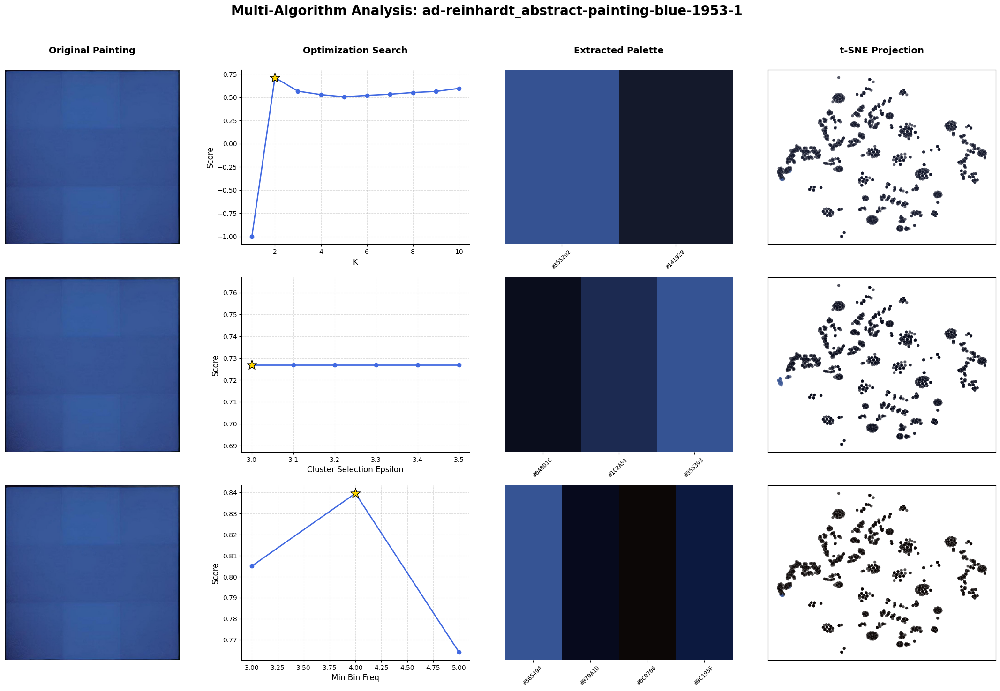

In [63]:
app.run_analysis("ad-reinhardt_abstract-painting-blue-1953-1.jpg")

## Análisis: Abstract Painting, Blue (1953)

* **KMeans**: Casi no logró encontrar diversidad en la pintura; el resultado es muy plano.
* **HDBSCAN**: Logró encontrar una diversidad moderada que respeta la composición.
* **MeanShift**: Logró encontrar una amplia diversidad de tonos, capturando detalles sutiles.

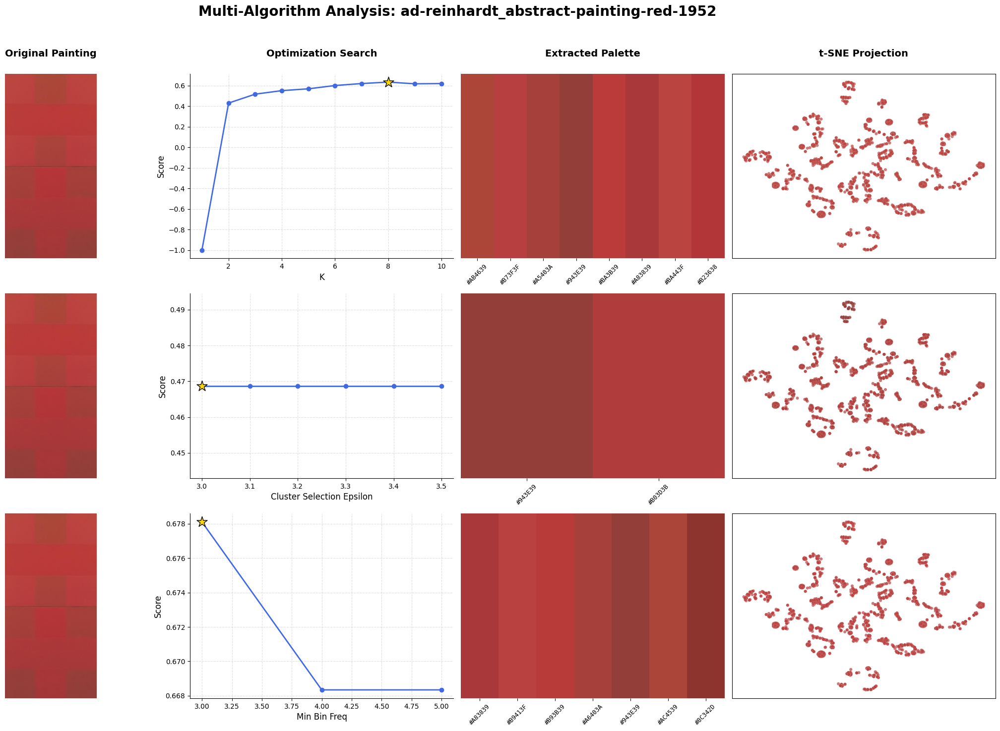

In [64]:
app.run_analysis("ad-reinhardt_abstract-painting-red-1952.jpg")

## Análisis: Abstract Painting, Red (1952)

* **KMeans**: Logró encontrar una amplia diversidad de tonos, capturando la mayoría de las variaciones presentes en la obra.
* **HDBSCAN**: Casi no logró encontrar diversidad; el resultado se reduce a solo dos bloques de color muy similares.
* **MeanShift**: Logró encontrar una amplia diversidad, identificando múltiples matices sutiles a lo largo de la composición.

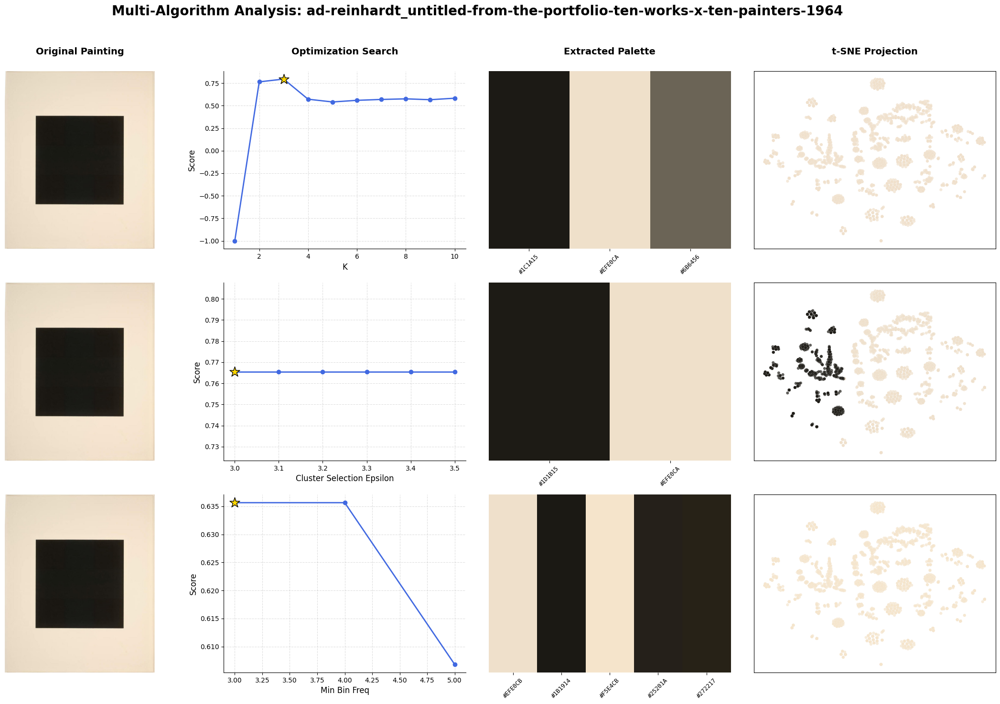

In [65]:
app.run_analysis(
    "ad-reinhardt_untitled-from-the-portfolio-ten-works-x-ten-painters-1964.jpg"
)

## Análisis: Untitled from Ten Works by Ten Painters (1964)

* **KMeans**: Logró encontrar una diversidad moderada, identificando los tonos principales y un matiz intermedio.
* **HDBSCAN**: Casi no logró encontrar diversidad; el resultado se limita a los dos contrastes más evidentes.
* **MeanShift**: Logró encontrar una amplia diversidad, detectando múltiples variaciones sutiles dentro de la composición.

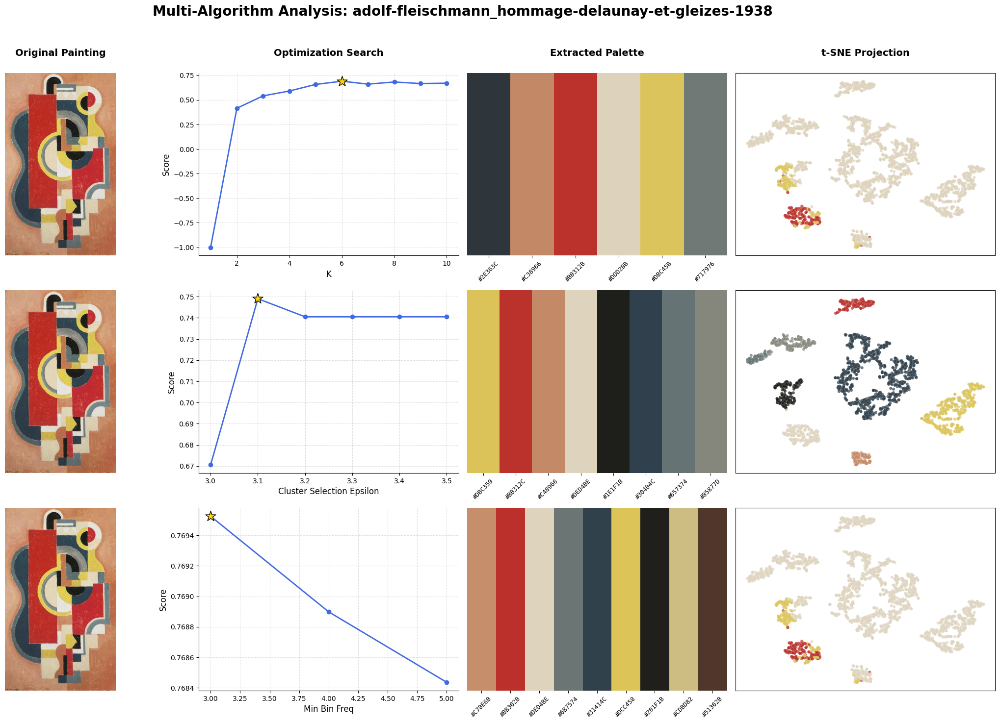

In [66]:
app.run_analysis("adolf-fleischmann_hommage-delaunay-et-gleizes-1938.jpg")

## Análisis: Hommage à Delaunay et Gleizes (1938)

* **KMeans**: Logró encontrar una amplia diversidad de colores, capturando los tonos primarios y neutros más importantes.
* **HDBSCAN**: Logró encontrar una amplia diversidad, identificando una gran variedad de matices distintos en la composición.
* **MeanShift**: Logró encontrar una amplia diversidad, detectando la mayoría de las variaciones cromáticas de la obra.

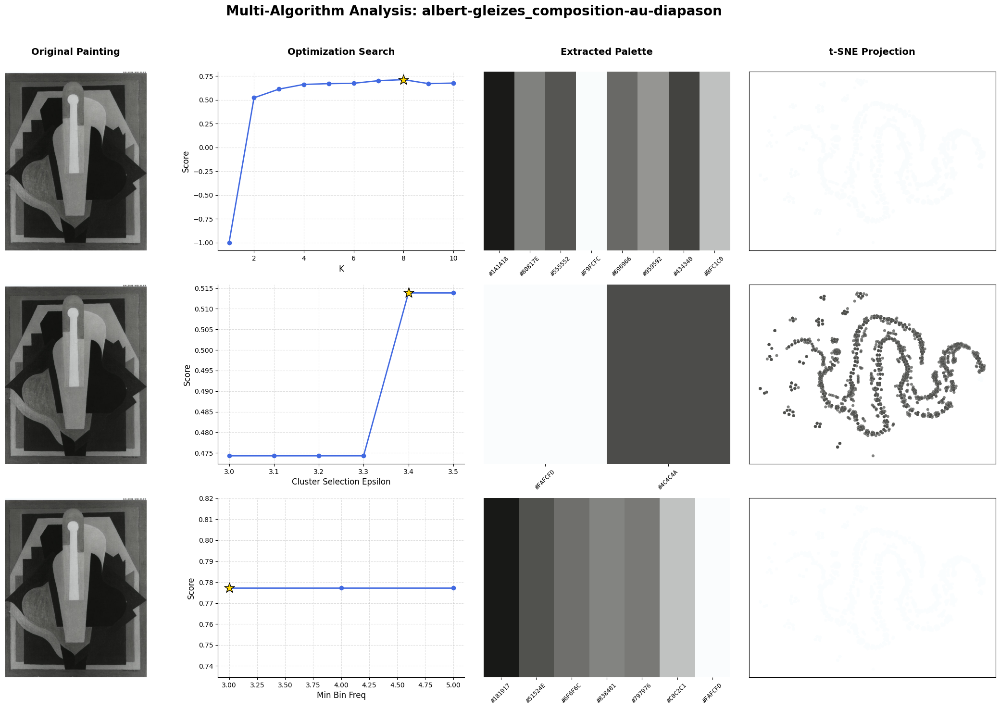

In [67]:
app.run_analysis("albert-gleizes_composition-au-diapason.jpg")

## Análisis: Composition au Diapason

* **KMeans**: Logró encontrar una amplia diversidad de tonos, identificando una gama variada de grises y neutros.
* **HDBSCAN**: Casi no logró encontrar diversidad; el resultado se reduce drásticamente a solo dos bloques de contraste.
* **MeanShift**: Logró encontrar una amplia diversidad, detectando múltiples gradaciones sutiles dentro de la escala de grises.

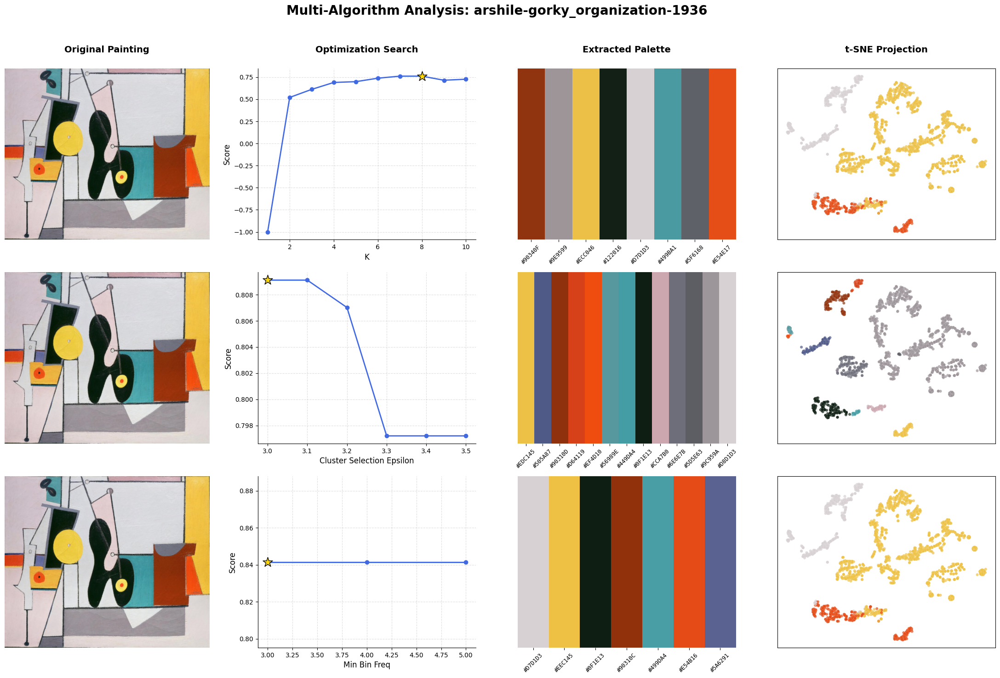

In [68]:
app.run_analysis("arshile-gorky_organization-1936.jpg")

## Análisis: Organization (1936)

* **KMeans**: Logró encontrar una amplia diversidad de colores, extrayendo una paleta variada que representa bien los elementos de la obra.
* **HDBSCAN**: Logró encontrar una amplia diversidad, identificando una gran cantidad de matices y tonos específicos por separado.
* **MeanShift**: Logró encontrar una amplia diversidad, detectando los colores principales y sus contrastes más marcados.

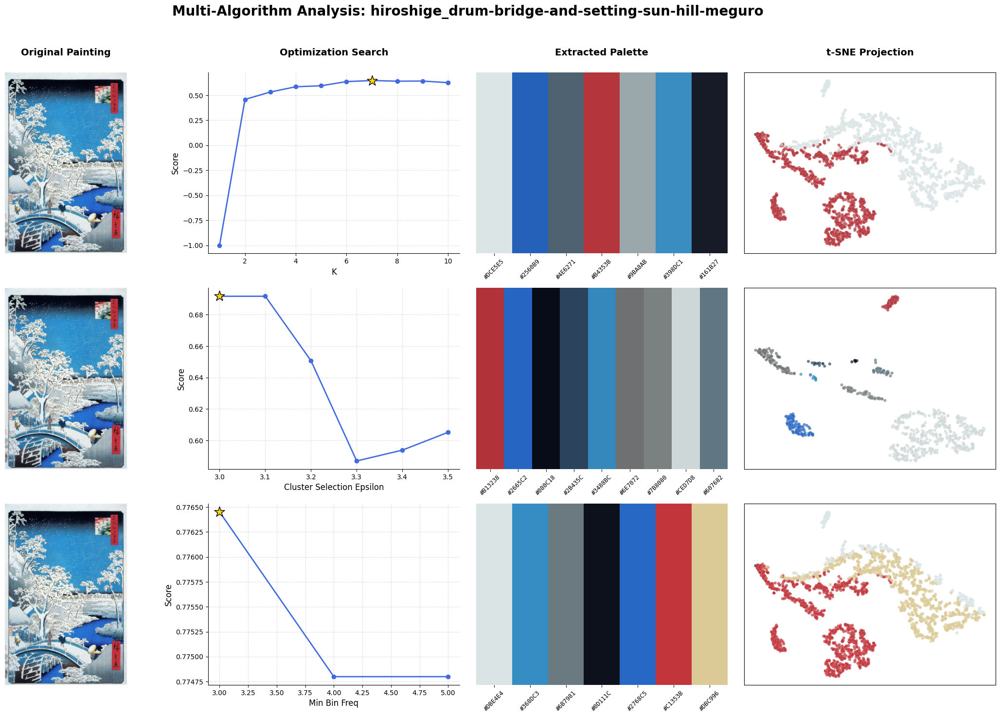

In [69]:
app.run_analysis("hiroshige_drum-bridge-and-setting-sun-hill-meguro.jpg")

## Análisis: Drum Bridge and Setting Sun, Hill Meguro

* **KMeans**: Logró encontrar una amplia diversidad de tonos, capturando bien la transición entre los azules del cielo y los neutros de la nieve.
* **HDBSCAN**: Logró encontrar una amplia diversidad, identificando matices específicos en las sombras y los detalles del puente.
* **MeanShift**: Logró encontrar una amplia diversidad, detectando la mayoría de las variaciones cromáticas, incluyendo los tonos amarillentos.

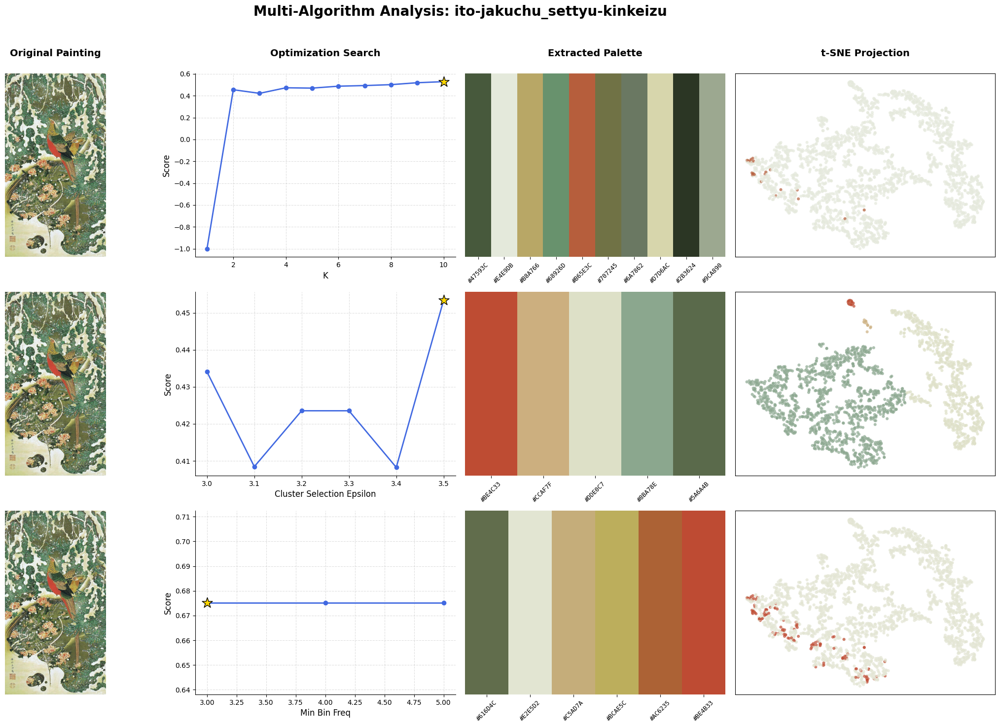

In [70]:
app.run_analysis("ito-jakuchu_settyu-kinkeizu.jpg")

## Análisis: Settyu Kinkeizu

* **KMeans**: Logró encontrar una amplia diversidad de tonos, identificando una gama extensa de verdes, tierras y neutros que componen la naturaleza de la obra.
* **HDBSCAN**: Logró encontrar una diversidad moderada, agrupando los elementos en los bloques de color más representativos del plumaje y el follaje.
* **MeanShift**: Logró encontrar una amplia diversidad, detectando múltiples variaciones sutiles y matices específicos en las texturas de la nieve y las plantas.

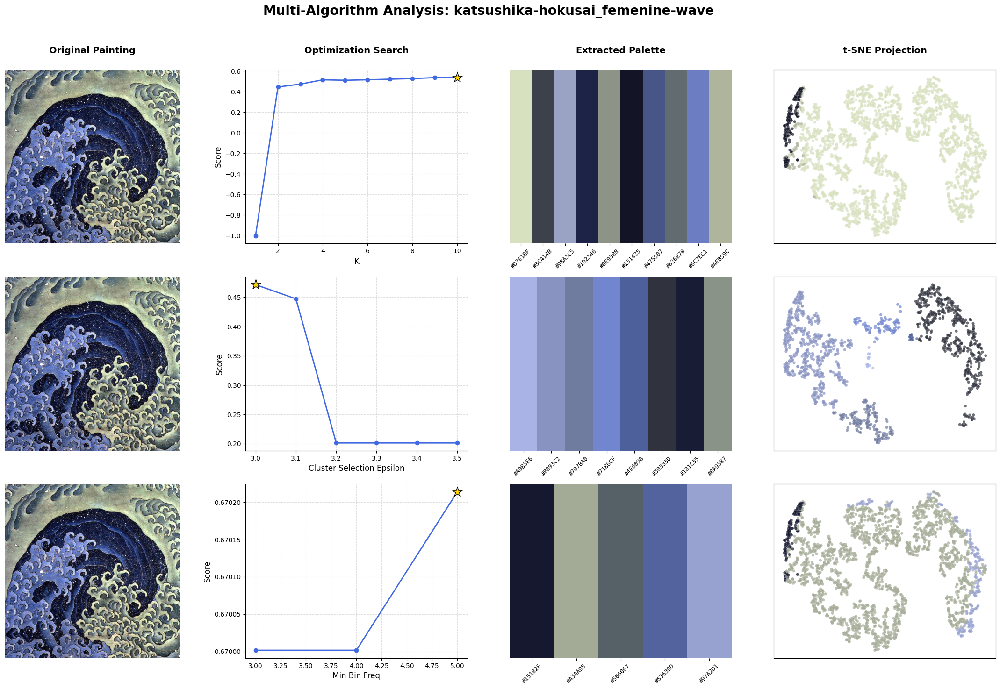

In [71]:
app.run_analysis("katsushika-hokusai_femenine-wave.jpg")

## Análisis: Feminine Wave

* **KMeans**: Logró encontrar una amplia diversidad de tonos, capturando la escala completa de azules, grises y los neutros de la espuma.
* **HDBSCAN**: Logró encontrar una amplia diversidad, identificando distintos matices de azul profundo y tonos grisáceos por separado.
* **MeanShift**: Logró encontrar una amplia diversidad, detectando variaciones sutiles en los degradados del agua y las zonas más claras de la cresta.

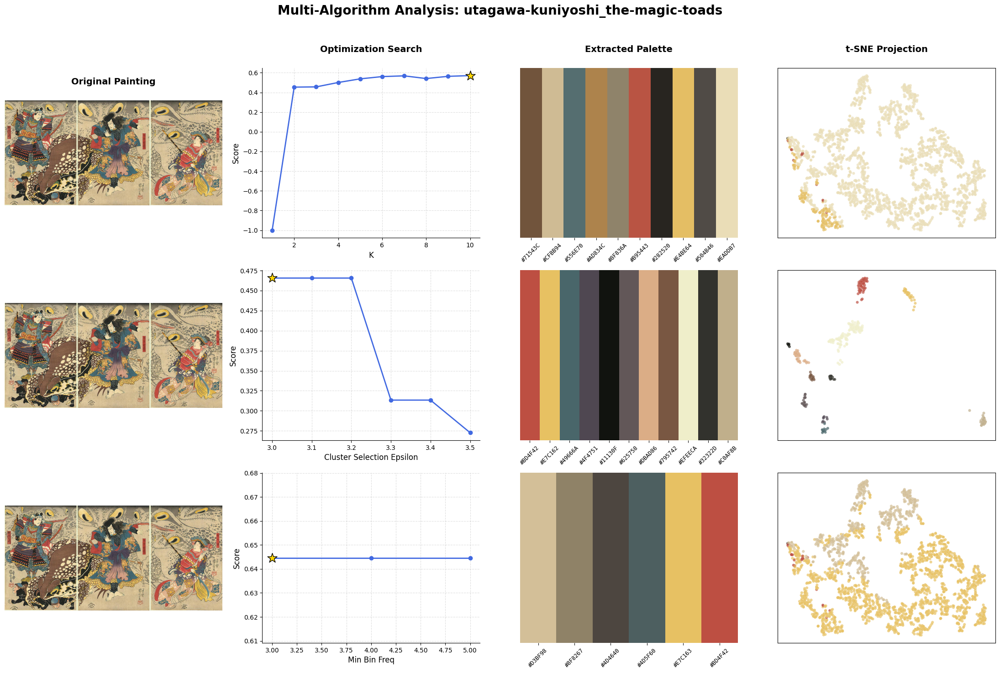

In [72]:
app.run_analysis("utagawa-kuniyoshi_the-magic-toads.jpg")

## Análisis: The Great Battle of the Frogs

* **KMeans**: Logró encontrar una amplia diversidad de tonos, capturando los colores tierra del entorno y los verdes específicos de las vestimentas.
* **HDBSCAN**: Logró encontrar una amplia diversidad, identificando matices distintos en las figuras individuales y los contrastes del fondo.
* **MeanShift**: Logró encontrar una amplia diversidad, detectando variaciones cromáticas en la piel de las ranas y los detalles de sus trajes.

# Conclusiones

El presente análisis integra la precisión del aprendizaje no supervisado con la sensibilidad del diseño visual. A continuación, se detallan las decisiones arquitectónicas, técnicas y artísticas que definieron el éxito del proyecto.

---

### 1. El Pilar Perceptual: CIELAB vs. RGB
Una de las decisiones más críticas del proyecto fue la transición del espacio de color RGB al modelo **CIELAB**.
* **Uniformidad Perceptual**: A diferencia del espacio RGB, CIELAB es un modelo perceptualmente uniforme, lo que garantiza que la distancia matemática entre dos puntos corresponda fielmente a la diferencia de color percibida por el ojo humano ($\Delta E$).
* **Coherencia Artística**: Esta transformación permite que los algoritmos agrupen píxeles basándose en su similitud visual real, evitando las distorsiones de brillo digital propias del espacio RGB.

### 2. El Pipeline de Preprocesamiento: Claridad y Eficiencia
El preprocesamiento se diseñó para optimizar el rendimiento y refinar la capacidad de detección del sistema:
* **Reducción de Ruido (LANCZOS)**: Al reescalar las obras al 25% mediante interpolación de LANCZOS, se eliminan texturas de alta frecuencia, facilitando que los modelos se enfoquen en las masas de color dominantes.
* **Aislamiento del Color (Flattening)**: La transformación de la matriz a una estructura tabular despoja a los píxeles de su información posicional, obligando al sistema a analizar la obra puramente por su densidad cromática.

### 3. Evaluación Híbrida: El Equilibrio entre Ingeniero y Diseñador
Se determinó que el Coeficiente de Silueta por sí solo es insuficiente para evaluar el arte, ya que tiende a favorecer soluciones excesivamente simplificadas.
* **La Tensión de la Métrica**: Mientras el enfoque técnico busca maximizar la cohesión, el diseño requiere diversidad para capturar la esencia de la obra.
* **Métrica Ponderada**: Se implementó el evaluador `PaletteEvaluator`, que equilibra la cohesión técnica con la variedad cromática, buscando un punto óptimo de representatividad artística.

### 4. Comportamiento de Algoritmos y Hallazgos Críticos
El análisis reveló una dualidad en el comportamiento de los modelos según la complejidad de la obra:
* **KMeans (Estructura)**: Ideal para síntesis generales y paletas de tamaño fijo, aunque puede simplificar en exceso la geometría en piezas minimalistas.
* **HDBSCAN (La Dualidad de Densidad)**: Se observó un comportamiento ambivalente; actúa con rigidez conservadora en obras simples, pero se torna laxo y detallista en piezas complejas, identificando subtonos que otros modelos promediarían.
* **MeanShift (La Lente del Acento)**: Resultó ser el modelo más consistente para detectar una amplia diversidad, localizando acentos específicos que definen la atmósfera de la pieza.

### 5. Guía de Aplicación para el Diseño
Se recomienda la selección del algoritmo según el objetivo creativo:

| Algoritmo | Perfil de Uso | Cuándo usarlo (Diseñador) |
| :--- | :--- | :--- |
| **KMeans** | Resumen Estructural | Para paletas de tamaño fijo en identidades visuales o logotipos. |
| **HDBSCAN** | Precisión de Densidad | Para extraer tanto bloques sólidos como redes complejas de subtonos. |
| **MeanShift** | Exploración de Matices | Para capturar la atmósfera y los acentos ocultos de la obra. |

---

### Conclusiones Finales

El proyecto demuestra que la extracción de color en el arte es una sinergia entre el rigor del procesamiento de datos y la sensibilidad de la percepción humana. A través de la arquitectura desarrollada, se han alcanzado las siguientes conclusiones:

* **Superioridad Perceptual del Espacio CIELAB**: La implementación de **CIELAB** es fundamental para garantizar que las paletas sean coherentes con la experiencia estética real, al calcular distancias cromáticas proporcionales a la visión humana.
* **Dualidad y Especialización Algorítmica**: No existe un modelo universal; la eficiencia de **KMeans**, la dualidad de **HDBSCAN** y la sensibilidad de **MeanShift** ofrecen herramientas distintas para capturar la atmósfera de una obra.
* **Necesidad de Métricas Híbridas**: El éxito del sistema radica en una evaluación ponderada que permite a la tecnología entender las composiciones más allá de la simple cuenta de píxeles, equilibrando la cohesión técnica con la diversidad cromática.